# DETR + LoRA Inference Notebook

This notebook shows how to load a base DETR model (`facebook/detr-resnet-50`), apply LoRA adapters from `./lora-detr`, and run object detection on an image. It targets a small custom label set (3 classes) and uses GPU if available.

## Setup
- Ensure `./lora-detr` contains your adapter files (e.g., `adapter_config.json`, `adapter_model.bin`).
- Update `CLASS_NAMES` to match your three-class vocabulary.
- Install required packages below if not already present.

In [86]:
# Install dependencies (run once). Comment out if already installed.
#!pip install --quiet torch transformers peft pillow timm

## Imports and configuration

In [87]:
import json
import os
from typing import List, Dict, Any

import torch
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoImageProcessor, DetrForObjectDetection
from peft import PeftModel

BASE_MODEL = "facebook/detr-resnet-50"
LORA_PATH = "./lora-detr"  # directory containing adapter_config.json and adapter_model.bin
USE_LORA = True  # set to False to skip LoRA if adapters are missing
CLASS_NAMES = ["bird", "animal", "insect", "person"]  # used only when LoRA is loaded
DEFAULT_SCORE_THRESHOLD = 0.3  # lower threshold for better detection

# =============================================================================
# TOMATO PLANT PROTECTION - Intrusion Detection Classes
# =============================================================================
# Threats to tomato plants:
# - Birds: eat tomatoes, peck at fruits
# - Cats/dogs: dig around plants, damage roots
# - Rodents: eat fruits (not in COCO)
# - Insects: aphids, hornworms, etc. (NOT in COCO - need LoRA training!)
# - Large animals: deer, rabbits, etc. (some in COCO)
#
# NOTE: For INSECT detection, you MUST train a LoRA adapter on insect images!
# =============================================================================

COCO_INTRUSION_CLASSES = {
    0: "person",       # trespassers
    14: "bird",        # eat tomatoes, major pest!
    15: "cat",         # dig around plants
    16: "dog",         # damage plants
    17: "horse",       # trample plants
    18: "sheep",       # eat plants
    19: "cow",         # trample/eat
    20: "elephant",    # (unlikely but included)
    21: "bear",        # (unlikely but included)
    22: "zebra",       # (unlikely)
    23: "giraffe",     # (unlikely)
}

# Threat level colors for visualization
THREAT_COLORS = {
    "bird": "red",        # HIGH threat to tomatoes
    "cat": "orange",
    "dog": "orange",
    "person": "yellow",
    "sheep": "red",
    "cow": "red",
    "horse": "orange",
}

In [88]:
def get_device() -> torch.device:
    return torch.device("cuda" if torch.cuda.is_available() else "cpu")


def load_processor() -> AutoImageProcessor:
    return AutoImageProcessor.from_pretrained(BASE_MODEL)


def load_model(device: torch.device) -> DetrForObjectDetection:
    try:
        base_model = DetrForObjectDetection.from_pretrained(BASE_MODEL)
    except ImportError as e:
        if "timm" in str(e).lower():
            raise ImportError("Missing dependency 'timm'. Install via `pip install timm`, then restart kernel.") from e
        raise

    use_lora = USE_LORA
    if use_lora:
        if not os.path.isdir(LORA_PATH):
            print(f"LoRA path '{LORA_PATH}' not found. Using base COCO model (no insect detection).")
            use_lora = False
        else:
            cfg_path = os.path.join(LORA_PATH, "adapter_config.json")
            model_path = os.path.join(LORA_PATH, "adapter_model.bin")
            missing = []
            if not os.path.isfile(cfg_path):
                missing.append("adapter_config.json")
            if not os.path.isfile(model_path):
                missing.append("adapter_model.bin")
            if missing:
                print(f"Missing LoRA files: {', '.join(missing)}. Using base COCO model (no insect detection).")
                use_lora = False

    if use_lora:
        model = PeftModel.from_pretrained(base_model, LORA_PATH, is_trainable=False)
        # Custom classes for LoRA (can include insect if trained)
        id2label = {i: name for i, name in enumerate(CLASS_NAMES)}
        label2id = {name: i for i, name in id2label.items()}
        model.config.id2label = id2label
        model.config.label2id = label2id
        model.config.num_labels = len(CLASS_NAMES)
    else:
        model = base_model
        # COCO classes for base model (bird, cat, dog, etc. but NO insect)
        model.config.id2label = COCO_INTRUSION_CLASSES
        model.config.label2id = {v: k for k, v in COCO_INTRUSION_CLASSES.items()}

    model.to(device)
    model.eval()
    return model


def prepare_image(image_path: str) -> Image.Image:
    if not os.path.isfile(image_path):
        raise FileNotFoundError(f"Image not found: {image_path}")
    return Image.open(image_path).convert("RGB")


def run_inference(image_path: str, score_threshold: float = DEFAULT_SCORE_THRESHOLD) -> List[Dict[str, Any]]:
    device = get_device()
    processor = load_processor()
    model = load_model(device)

    image = prepare_image(image_path)
    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    target_sizes = torch.tensor([image.size[::-1]], device=device)  # (h, w)
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes)[0]

    detections: List[Dict[str, Any]] = []
    for score, label_id, box in zip(results["scores"], results["labels"], results["boxes"]):
        score_val = score.item()
        if score_val < score_threshold:
            continue
        label_id_val = label_id.item()
        # Skip classes not in our intrusion mapping
        if label_id_val not in model.config.id2label:
            continue
        x_min, y_min, x_max, y_max = [round(coord.item(), 1) for coord in box]
        label = model.config.id2label[label_id_val]
        detections.append({
            "label": label,
            "score": round(score_val, 3),
            "box": {"xmin": x_min, "ymin": y_min, "xmax": x_max, "ymax": y_max},
        })
    return detections

## Visualize detections
Draw boxes and labels on the image and optionally save it.

In [89]:
from IPython.display import display

def visualize_detections(image_path: str, detections: List[Dict[str, Any]], save_path: str | None = None):
    """Overlay detections on the image with threat-level colors; returns a PIL Image."""
    if not detections:
        raise ValueError("No detections to visualize")

    image = prepare_image(image_path).copy()
    draw = ImageDraw.Draw(image)
    font = ImageFont.load_default()

    for idx, det in enumerate(detections):
        box = det.get("box", {})
        label = det.get("label", "")
        score = det.get("score", 0.0)
        
        # Use threat-level color if available, else default
        color = THREAT_COLORS.get(label, "lime")

        x0, y0 = box.get("xmin", 0), box.get("ymin", 0)
        x1, y1 = box.get("xmax", 0), box.get("ymax", 0)
        draw.rectangle([(x0, y0), (x1, y1)], outline=color, width=3)

        pct = int(round(score * 100))
        text = f"{label.upper()} {pct}%"
        try:
            bbox = draw.textbbox((0, 0), text, font=font)
            tw, th = bbox[2] - bbox[0], bbox[3] - bbox[1]
        except Exception:
            tw, th = draw.textsize(text, font=font)
        text_bg = [(x0), max(0, y0 - th - 4), (x0 + tw + 6), y0]
        draw.rectangle(text_bg, fill=color)
        draw.text((x0 + 3, max(0, y0 - th - 2)), text, fill="white", font=font)

    if save_path:
        image.save(save_path)
    return image

## Batch inference (folder)
Run detection over a folder of images to spot intrusions in one go.

In [90]:
from pathlib import Path


def run_inference_on_folder(folder_path: str, score_threshold: float = DEFAULT_SCORE_THRESHOLD):
    """Run inference on all images in a folder; returns dict[path] -> detections."""
    folder = Path(folder_path)
    if not folder.is_dir():
        raise FileNotFoundError(f"Folder not found: {folder_path}")

    results = {}
    exts = {".jpg", ".jpeg", ".png", ".bmp"}
    for img_file in sorted(p for p in folder.iterdir() if p.suffix.lower() in exts):
        try:
            results[str(img_file)] = run_inference(str(img_file), score_threshold=score_threshold)
        except Exception as exc:  # keep going even if one file fails
            results[str(img_file)] = {"error": str(exc)}
    return results

## Run inference
Update the image path and (optionally) the class names list to match your LoRA training labels.

In [91]:
# Quick diagnostics for common errors
import os, json, torch
from pathlib import Path

print("CUDA available:", torch.cuda.is_available())
print("Working dir:", os.getcwd())

img_path = Path("./z.jpg")
print("z.jpg exists:", img_path.is_file())
if img_path.is_file():
    print("z.jpg size (bytes):", img_path.stat().st_size)

lora_dir = Path("./lora-detr")
print("lora-detr exists:", lora_dir.is_dir())
if lora_dir.is_dir():
    cfg_path = lora_dir / "adapter_config.json"
    model_path = lora_dir / "adapter_model.bin"
    print("adapter_config.json exists:", cfg_path.is_file())
    print("adapter_model.bin exists:", model_path.is_file())
    if cfg_path.is_file():
        try:
            with cfg_path.open() as f:
                cfg = json.load(f)
            print("adapter_config keys:", list(cfg.keys()))
            print("num adapters in config:", len(cfg.get("peft_config", {})))
        except Exception as e:
            print("Failed to read adapter_config.json:", e)

print("CLASS_NAMES:", CLASS_NAMES, "len:", len(CLASS_NAMES))

CUDA available: False
Working dir: c:\Users\Amine\Desktop\SE_p
z.jpg exists: True
z.jpg size (bytes): 122601
lora-detr exists: False
CLASS_NAMES: ['bird', 'animal', 'insect', 'person'] len: 4


In [92]:
# pip install timm

In [93]:
# =============================================================================
# TOMATO PLANT PROTECTION - Run Intrusion Detection
# =============================================================================
image_path = "./3.jpg"  # update to your image

detections = run_inference(image_path, score_threshold=DEFAULT_SCORE_THRESHOLD)

if not detections:
    print("✓ No intrusions detected (birds, cats, dogs, etc.)")
    print("\n--- Debug: Checking ALL model detections ---")
    
    device = get_device()
    processor = load_processor()
    model = load_model(device)
    image = prepare_image(image_path)
    inputs = processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
    target_sizes = torch.tensor([image.size[::-1]], device=device)
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.1)[0]
    
    # COCO class names for debugging
    COCO_CLASSES = {0: 'person', 1: 'bicycle', 2: 'car', 14: 'bird', 15: 'cat', 16: 'dog', 
                    46: 'banana', 47: 'apple', 49: 'orange', 50: 'broccoli', 58: 'potted plant'}
    
    print(f"Total detections above 10%: {len(results['scores'])}")
    for score, label_id in zip(results["scores"][:15], results["labels"][:15]):
        cls_id = label_id.item()
        cls_name = COCO_CLASSES.get(cls_id, f"class_{cls_id}")
        print(f"  {cls_name} (id={cls_id}): {score.item()*100:.0f}%")
else:
    print("⚠ INTRUSION ALERT! Threats detected:\n")
    for det in detections:
        label = det["label"]
        pct = int(round(det["score"] * 100))
        box = det["box"]
        threat = "HIGH" if label in ["bird", "sheep", "cow"] else "MEDIUM"
        print(f"  [{threat}] {label.upper()} ({pct}%) at ({box['xmin']:.0f}, {box['ymin']:.0f})")

    # Visualize with threat colors
    viz_img = visualize_detections(image_path, detections, save_path="./intrusion_alert.jpg")
    display(viz_img)
    print(f"\n→ Alert image saved to: intrusion_alert.jpg")

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


LoRA path './lora-detr' not found. Using base COCO model (no insect detection).
✓ No intrusions detected (birds, cats, dogs, etc.)

--- Debug: Checking ALL model detections ---


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


LoRA path './lora-detr' not found. Using base COCO model (no insect detection).
Total detections above 10%: 8
  class_53 (id=53): 98%
  class_53 (id=53): 94%
  class_53 (id=53): 96%
  class_53 (id=53): 15%
  class_53 (id=53): 13%
  class_53 (id=53): 12%
  class_53 (id=53): 24%
  class_53 (id=53): 99%


## Insect Detection with OWL-ViT
Use open-vocabulary detection for insects (aphids, caterpillars, beetles, etc.)

In [94]:
# Install OWL-ViT dependencies (run once)
# !pip install --quiet transformers[torch]

In [95]:
from transformers import OwlViTProcessor, OwlViTForObjectDetection

# =============================================================================
# OWL-ViT: Open-Vocabulary Insect Detection
# =============================================================================
# This model can detect ANY object by text prompt - no training needed!
# Perfect for detecting insects that threaten tomato plants.

INSECT_QUERIES = [
    "insect",
    "aphid",
    "caterpillar", 
    "tomato hornworm",
    "whitefly",
    "beetle",
    "spider mite",
    "bug",
    "fly",
    "bee",
    "wasp",
]

_owl_processor = None
_owl_model = None

def load_owl_vit():
    """Load OWL-ViT model for open-vocabulary detection."""
    global _owl_processor, _owl_model
    if _owl_processor is None:
        print("Loading OWL-ViT model (first time may take a minute)...")
        _owl_processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
        _owl_model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")
        device = get_device()
        _owl_model.to(device)
        _owl_model.eval()
        print(f"OWL-ViT loaded on {device}")
    return _owl_processor, _owl_model


def detect_insects(image_path: str, queries: List[str] = None, score_threshold: float = 0.1) -> List[Dict[str, Any]]:
    """Detect insects using OWL-ViT open-vocabulary detection."""
    if queries is None:
        queries = INSECT_QUERIES
    
    processor, model = load_owl_vit()
    device = get_device()
    
    image = prepare_image(image_path)
    inputs = processor(text=queries, images=image, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Post-process
    target_sizes = torch.tensor([image.size[::-1]], device=device)
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=score_threshold)[0]
    
    detections = []
    for score, label_id, box in zip(results["scores"], results["labels"], results["boxes"]):
        x_min, y_min, x_max, y_max = [round(coord.item(), 1) for coord in box]
        label = queries[label_id.item()]
        detections.append({
            "label": label,
            "score": round(score.item(), 3),
            "box": {"xmin": x_min, "ymin": y_min, "xmax": x_max, "ymax": y_max},
        })
    
    return detections


def visualize_insects(image_path: str, detections: List[Dict[str, Any]], save_path: str | None = None):
    """Visualize insect detections with red warning boxes."""
    if not detections:
        raise ValueError("No detections to visualize")

    image = prepare_image(image_path).copy()
    draw = ImageDraw.Draw(image)
    font = ImageFont.load_default()

    for det in detections:
        box = det.get("box", {})
        label = det.get("label", "")
        score = det.get("score", 0.0)
        
        x0, y0 = box.get("xmin", 0), box.get("ymin", 0)
        x1, y1 = box.get("xmax", 0), box.get("ymax", 0)
        draw.rectangle([(x0, y0), (x1, y1)], outline="red", width=3)

        pct = int(round(score * 100))
        text = f"🐛 {label.upper()} {pct}%"
        try:
            bbox = draw.textbbox((0, 0), text, font=font)
            tw, th = bbox[2] - bbox[0], bbox[3] - bbox[1]
        except Exception:
            tw, th = draw.textsize(text, font=font)
        text_bg = [(x0), max(0, y0 - th - 4), (x0 + tw + 6), y0]
        draw.rectangle(text_bg, fill="red")
        draw.text((x0 + 3, max(0, y0 - th - 2)), text, fill="white", font=font)

    if save_path:
        image.save(save_path)
    return image

TOMATO PLANT PROTECTION SYSTEM

[1/2] Scanning for animals & birds (DETR)...


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


LoRA path './lora-detr' not found. Using base COCO model (no insect detection).
[2/2] Scanning for insects (OWL-ViT)...
Loading OWL-ViT model (first time may take a minute)...
OWL-ViT loaded on cpu

 ALERT! 1 threat(s) detected:

  [HIGH] INSECT: insect (40%) at (1510, 1460)

--- Generating alert image ---


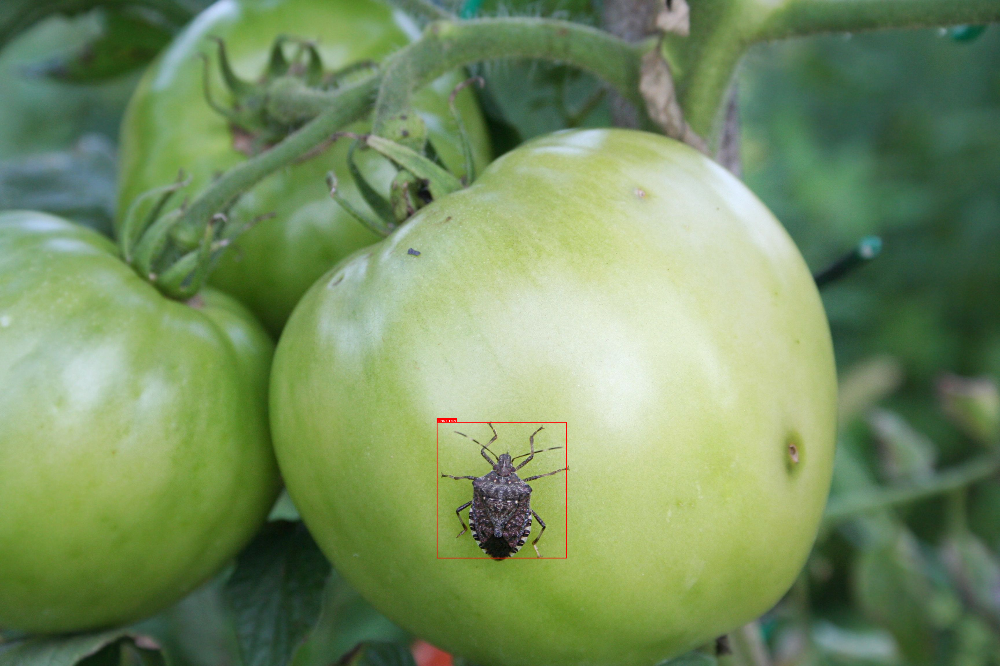


→ Alert saved to: tomato_protection_alert.jpg


In [96]:
# =============================================================================
# FULL TOMATO PROTECTION: Detect Animals + Insects
# =============================================================================
image_path = "./2.jpg"  # update to your image

print("=" * 50)
print("TOMATO PLANT PROTECTION SYSTEM")
print("=" * 50)

# 1. Detect animals/birds (DETR)
print("\n[1/2] Scanning for animals & birds (DETR)...")
animal_detections = run_inference(image_path, score_threshold=0.3)

# 2. Detect insects (OWL-ViT)
print("[2/2] Scanning for insects (OWL-ViT)...")
insect_detections = detect_insects(image_path, score_threshold=0.1)

# Combine results
all_detections = animal_detections + insect_detections

if not all_detections:
    print("\n ALL CLEAR - No threats detected!")
else:
    print(f"\n ALERT! {len(all_detections)} threat(s) detected:\n")
    
    for det in all_detections:
        label = det["label"]
        pct = int(round(det["score"] * 100))
        box = det["box"]
        
        # Determine threat type
        if label in INSECT_QUERIES or "insect" in label.lower():
            threat_type = "INSECT"
            threat_level = "HIGH"
        elif label in ["bird", "sheep", "cow"]:
            threat_type = "ANIMAL"
            threat_level = "HIGH"
        else:
            threat_type = "ANIMAL"
            threat_level = "MEDIUM"
        
        print(f"  [{threat_level}] {threat_type}: {label} ({pct}%) at ({box['xmin']:.0f}, {box['ymin']:.0f})")
    
    # Visualize combined results
    print("\n--- Generating alert image ---")
    image = prepare_image(image_path).copy()
    draw = ImageDraw.Draw(image)
    font = ImageFont.load_default()
    
    for det in all_detections:
        box = det["box"]
        label = det["label"]
        score = det["score"]
        
        # Red for insects, orange for animals
        is_insect = label in INSECT_QUERIES or "insect" in label.lower()
        color = "red" if is_insect else THREAT_COLORS.get(label, "orange")
        
        x0, y0 = box["xmin"], box["ymin"]
        x1, y1 = box["xmax"], box["ymax"]
        draw.rectangle([(x0, y0), (x1, y1)], outline=color, width=3)
        
        pct = int(round(score * 100))
        icon = "🐛" if is_insect else "!"
        text = f"{icon} {label.upper()} {pct}%"
        try:
            bbox = draw.textbbox((0, 0), text, font=font)
            tw, th = bbox[2] - bbox[0], bbox[3] - bbox[1]
        except:
            tw, th = 100, 12
        draw.rectangle([(x0, max(0, y0 - th - 4)), (x0 + tw + 6, y0)], fill=color)
        draw.text((x0 + 3, max(0, y0 - th - 2)), text, fill="white", font=font)
    
    image.save("./tomato_protection_alert.jpg")
    display(image)
    print("\n→ Alert saved to: tomato_protection_alert.jpg")